# NOTE TO THE EVALUATOR, PLEASE READ

The notebook takes data from a local directory namely <code>folder_path = './Assignment3_dataset/' </code>. It was suggested in the course discussion forum to upload data along with the notebook. As the dataset provided was of 82 MB , it was impossible to upload it on moodle(Limit exceded).<br><br>
This code will run properly in any directory where the extracted folder <code>Assignment3_dataset</code> is present. Futhermore All the plots and images are already presented by submittiong the executed notebook.<br><br>
All the imports that are used in this notebook are colledted together in the Import subsection below. All these imported smoothly on Google Collab and no error or requirement is shown.

In [1]:
# 120 .001 5e-5

# Imports

In [2]:
import torch
import torch.utils.data
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch import nn, optim
from torch.nn import functional as F
from torchvision import datasets, transforms
import torchvision
from torch.autograd import Variable
import numpy as np
import matplotlib.pyplot as plt

import argparse
import os
import random

import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from torch.utils.data import Subset
from torchvision.transforms import InterpolationMode
from torch.optim.lr_scheduler import StepLR

from sklearn.model_selection import train_test_split


# Helper Functions

In [3]:
def plot_images(X, batch=True, save=False, title='one'):
    
    """
    Plots batch of images as well as normal single image 
    Input is X : torch tensor : shape batch x 3 x h x w
    """
    
    if batch:
        # Assuming you have a batch of images with shape Bx3x64x64
        num_cols = 8  # Specify the number of rows and columns in the grid
        num_rows = len(X)//num_cols if len(X)//num_cols else 1 

        # Create a figure and a grid of subplots to display the images
        fig, axs = plt.subplots(num_rows, num_cols, figsize=(num_cols, num_rows))

        # Iterate through the batch and plot each image in the grid
        for i in range(num_rows):
            for j in range(num_cols):
                idx = i * num_cols + j
                image = X[idx].permute(1, 2, 0).numpy()  # Convert to HxWxC format
                axs[i, j].imshow((image*255).astype("uint8"))
                axs[i, j].axis('off')

        # Adjust spacing and layout
        # Reduce spacing between subplots
        plt.subplots_adjust(wspace=0.025, hspace=0.025)
        
        # Save the subplots as an image
        if save:
            plot_name = title + '.png' 
            plt.savefig(plot_name)
            
    else:
        # Note here X should be an image 3xhxw
        plt.figure(figsize=(2, 2))
        plt.imshow(np.transpose(X, (1, 2, 0)))

    # Show the plot
    plt.show()

In [4]:
def compare_images(image1, image2, scale=1):
    
    # images are torch tensors
    image1 = np.transpose(image1.numpy(),(1,2,0))
    image2 = np.transpose(image2.numpy(),(1,2,0))
        
    # Create a new figure
    fig, axes = plt.subplots(1, 2, figsize=(scale*8, scale*4))  # Create a 1x2 grid of subplots

    # Plot image1 on the first subplot
    axes[0].imshow(image1)
    axes[0].axis('off')  # Turn off axis labels
    axes[0].set_title(f'Initial Image')

    # Plot image2 on the second subplot
    axes[1].imshow(image2)
    axes[1].axis('off')  # Turn off axis labels
    axes[1].set_title(f'Transformed Image')

    # Adjust spacing between the subplots
    plt.subplots_adjust(wspace=0.1)

    # Show the combined figure with both images side by side
    plt.show()
    

In [5]:
def augment_data(X, plot=False):
    
    if plot:
        print("########## ORIGINAL IMAGES ##########")
        plot_images(X)

    # Gamma balance the image
    gamma = 1.8
    X_gamma =  torch.clamp(X * gamma, 0, 1)
    if plot:
        print("########## GAMMA IMAGES ##########")
        plot_images(X_gamma)

    # Sharpen the images
    X_sharper = torchvision.transforms.functional.adjust_sharpness(X_gamma, sharpness_factor=3.5)
    if plot:
        print("########## SHARPER IMAGES ##########")
        plot_images(X_sharper)

    # Rotate the images +5
    X_rotated_plus = torchvision.transforms.functional.rotate(X_sharper,angle=5, interpolation= InterpolationMode.BILINEAR)
    if plot:
        print("########## +5 ROTATED IMAGES ##########")
        plot_images(X_rotated_plus)

    # Rotate the images -5
    X_rotated_minus = torchvision.transforms.functional.rotate(X_sharper,angle=-5, interpolation= InterpolationMode.BILINEAR)
    if plot:
        print("########## -5 ROTATED IMAGES ##########")
        plot_images(X_rotated_minus) 

    # Concatenate images
    X_out = torch.cat((X_sharper, X_rotated_plus, X_rotated_minus), dim=0)

    # Flip the images
    X_flipped = torchvision.transforms.functional.hflip(X_sharper)
    if plot:
        print("########## FLIPPED IMAGES ##########")
        plot_images(X_flipped) 

    # Rotate the flipped images +5
    X_flipped_rotated_plus = torchvision.transforms.functional.rotate(X_flipped ,angle=5, interpolation= InterpolationMode.BILINEAR)
    if plot:
        print("########## FLIPPED +5 ROTATED IMAGES ##########")
        plot_images(X_flipped_rotated_plus)

    # Rotate the flipped images -5
    X_flipped_rotated_minus = torchvision.transforms.functional.rotate(X_flipped ,angle=-5, interpolation= InterpolationMode.BILINEAR)
    if plot:
        print("########## FLIPPED -5 ROTATED IMAGES ##########")
        plot_images(X_flipped_rotated_minus)

    # Concatenate images
    X_out = torch.cat((X_out , X_flipped, X_flipped_rotated_plus, X_flipped_rotated_minus), dim=0)
    
    return X_out
    

In [6]:
def seed_all(seed_val=42):
    # Set the seed for the random number generator in PyTorch
    torch.manual_seed(seed_val)

    # Set the seed for the random number generator in the Python standard library (random module)
    random.seed(seed_val)

    # Set the seed for the random number generator in NumPy
    np.random.seed(seed_val)

    # Set the seed for the CUDA (GPU) operations if you are using GPUs
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed_val)
        torch.cuda.manual_seed_all(seed_val)

    # Additional configurations for deterministic behavior (not always necessary)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


In [7]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [8]:
def show_10(X):
    fig, axes = plt.subplots(1, 10, figsize=(12,8))  # Adjust the figsize as needed
    for i in range(10):
        image = ((X[i]+1.0)/2.0).permute(1, 2, 0).numpy()
        axes[i].imshow(image)
        axes[i].axis('off')

    plt.show()

_______________
# GAN 
_______________


In [9]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu=1, nz=100, ngf=64, nc=3):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)
    

class Discriminator(nn.Module):
    def __init__(self, ngpu=1, nz=100, ndf=64, nc=3):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

_______________
# VAE 
_______________

In [10]:
class VAE(nn.Module):

    def __init__(self,
                 in_channels: int,
                 latent_dim: int,
                 hidden_dims = None,
                 kld_w = 0.00025):
        super(VAE, self).__init__()
        
        self.latent_dim = latent_dim
        self.kld_w = kld_w 

        modules = []
        if hidden_dims is None:
            #hidden_dims = [32, 64, 128, 256, 512]
            hidden_dims = [32, 64, 128]
            

        # Build Encoder
        for h_dim in hidden_dims:
            modules.append(
                nn.Sequential(
                    nn.Conv2d(in_channels, out_channels=h_dim,
                              kernel_size= 3, stride= 2, padding  = 1),
                    nn.BatchNorm2d(h_dim),
                    nn.LeakyReLU())
            )
            in_channels = h_dim

        self.encoder = nn.Sequential(*modules)
        # 4 comes from 2x2
        # self.fc_mu = nn.Linear(hidden_dims[-1]*4, latent_dim)
        # self.fc_var = nn.Linear(hidden_dims[-1]*4, latent_dim)
        
        self.fc_mu = nn.Linear(hidden_dims[-1]*64, latent_dim)
        self.fc_var = nn.Linear(hidden_dims[-1]*64, latent_dim)

        
        
        # Build Decoder
        modules = []

        #self.decoder_input = nn.Linear(latent_dim, hidden_dims[-1] * 4)
        self.decoder_input = nn.Linear(latent_dim, hidden_dims[-1] * 64)
        

        hidden_dims.reverse()

        for i in range(len(hidden_dims) - 1):
            modules.append(
                nn.Sequential(
                    nn.ConvTranspose2d(hidden_dims[i],
                                       hidden_dims[i + 1],
                                       kernel_size=3,
                                       stride = 2,
                                       padding=1,
                                       output_padding=1),
                    nn.BatchNorm2d(hidden_dims[i + 1]),
                    nn.LeakyReLU())
            )



        self.decoder = nn.Sequential(*modules)

        self.final_layer = nn.Sequential(
                            nn.ConvTranspose2d(hidden_dims[-1],
                                               hidden_dims[-1],
                                               kernel_size=3,
                                               stride=2,
                                               padding=1,
                                               output_padding=1),
                            nn.BatchNorm2d(hidden_dims[-1]),
                            nn.LeakyReLU(),
                            nn.Conv2d(hidden_dims[-1], out_channels= 3,
                                      kernel_size= 3, padding= 1),
                            nn.Tanh())

    def encode(self, x):
        """
        Encodes the input by passing through the encoder network
        and returns the latent codes.
        :param input: (Tensor) Input tensor to encoder [N x C x H x W]
        :return: (Tensor) List of latent codes
        """
        result = self.encoder(x)
        result = torch.flatten(result, start_dim=1)

        # Split the result into mu and var components
        # of the latent Gaussian distribution
        mu = self.fc_mu(result)
        log_var = self.fc_var(result)

        return [mu, log_var]

    def decode(self, z):
        """
        Maps the given latent codes
        onto the image space.
        :param z: (Tensor) [B x D]
        :return: (Tensor) [B x C x H x W]
        """
        result = self.decoder_input(z)
        # 2,2 comes from 2x2
        #result = result.view(-1, 512, 2, 2)
        result = result.view(-1, 128, 8, 8)
        
        result = self.decoder(result)
        result = self.final_layer(result)
        return result

    def reparameterize(self, mu, logvar):
        """
        Reparameterization trick to sample from N(mu, var) from
        N(0,1).
        :param mu: (Tensor) Mean of the latent Gaussian [B x D]
        :param logvar: (Tensor) Standard deviation of the latent Gaussian [B x D]
        :return: (Tensor) [B x D]
        """
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return eps * std + mu

    def forward(self, x):
        mu, log_var = self.encode(x)
        z = self.reparameterize(mu, log_var)
        return  [self.decode(z), x, mu, log_var]

    def loss_function(self, args):
        """
        Computes the VAE loss function.
        KL(N(\mu, \sigma), N(0, 1)) = \log \frac{1}{\sigma} + \frac{\sigma^2 + \mu^2}{2} - \frac{1}{2}
        :param args:
        :param kwargs:
        :return:
        """
        recons = args[0]
        input = args[1]
        mu = args[2]
        log_var = args[3]
        
        kld_weight = self.kld_w # Account for the minibatch samples from the dataset
        recons_loss =F.mse_loss(recons, input)


        kld_loss = torch.mean(-0.5 * torch.sum(1 + log_var - mu ** 2 - log_var.exp(), dim = 1), dim = 0)

        loss = recons_loss + kld_weight * kld_loss
        return {'loss': loss, 'Reconstruction_Loss':recons_loss.detach(), 'KLD':-kld_loss.detach()}

    def sample(self, num_samples, current_device):
        """
        Samples from the latent space and return the corresponding
        image space map.
        :param num_samples: (Int) Number of samples
        :param current_device: (Int) Device to run the model
        :return: (Tensor)
        """
        z = torch.randn(num_samples,
                        self.latent_dim)

        z = z.to(current_device)

        samples = self.decode(z)
        return samples

    def generate(self, x):
        """
        Given an input image x, returns the reconstructed image
        :param x: (Tensor) [B x C x H x W]
        :return: (Tensor) [B x C x H x W]
        """

        return self.forward(x)[0]

# PROBLEM STATEMENT
## Use the DC-GAN you developed in Question (1) to train on category K and generate 10 images.Compare the quality of images generated using DC-GAN and VAE for category K. Similarly, use VAE in question (2) to train on category C and generate 10 images. Compare the quality of images generated using VAE and DC-GAN for category C. Explain your observations and the possible reasons for your observations.

In [11]:
# Decide which device we want to run on
device = torch.device("cuda:0" if torch.cuda.is_available()  else "cpu")

_________________
## Category C = 'BUS'
_________________

Total classes in folder : 3
Class to id dictionary : {'boat': 0, 'bus': 1, 'car': 2}
Index of the desired class : 1 
#################### SOME IMAGES FOR THE CATEGORY ####################


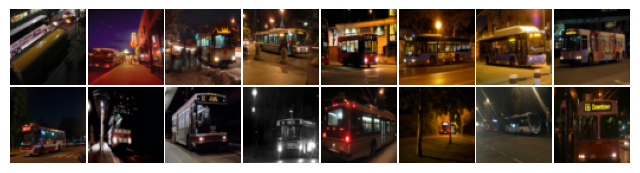

Images in the train set D1 : 97
Images in the test set V1 : 11


In [12]:
chosen_class = 'bus'     # Choose Category 'boat' 'bus' or 'car' (here K)
desired_width = 64
desired_height = 64
folder_path = './Assignment3_dataset/' 

class_names = os.listdir(folder_path)   # A list of images in folder path
print(f'Total classes in folder : {len(class_names)}')

# Create the dataset
dataset = datasets.ImageFolder(root=folder_path,
                               transform=transforms.Compose([
                               transforms.Resize((desired_height,desired_width)),
                               transforms.ToTensor(),
                           ]))


# Filter data according to desired class
print(f'Class to id dictionary : {dataset.class_to_idx}')
chosen_class_id = dataset.class_to_idx[chosen_class]
print(f'Index of the desired class : {chosen_class_id} ')

class_indices = []
for i in range(len(dataset)):
    if dataset.imgs[i][1]==chosen_class_id:
        class_indices.append(i)
subset = Subset(dataset, class_indices)

all_data = []
for idx in range(len(subset)):
    data, target = subset[idx]
    all_data.append((data, target))

d_loader = DataLoader(subset, batch_size=len(subset))
for batch in d_loader:
    X_all, _ = batch  # data and target are torch tensors

print("#################### SOME IMAGES FOR THE CATEGORY ####################")
plot_images(X_all[:16])

D1, V1 = train_test_split(X_all, test_size=0.1, random_state=42)
print(f"Images in the train set D1 : {D1.shape[0]}")
print(f"Images in the test set V1 : {V1.shape[0]}")

X_train = augment_data(D1, plot=False)
X_train = X_train[:576] 
X_val = augment_data(V1, plot=False)
X_val_norm = 2 * X_val - 1
X_val_norm  = X_val_norm.to(device)

_____
## GAN on CATEGORY C
______

########## EPOCH : 0 : STILL TRAINING ##########


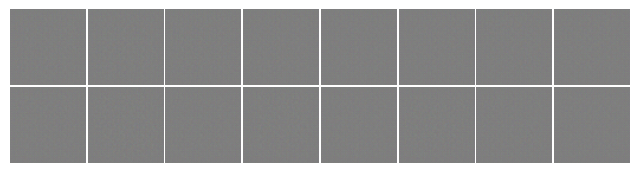

########## EPOCH : 25 : STILL TRAINING ##########


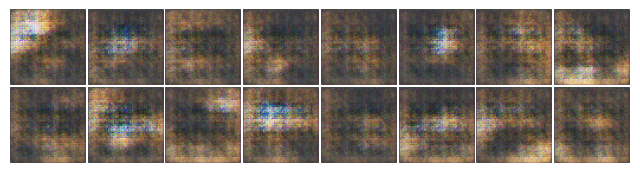

########## EPOCH : 50 : STILL TRAINING ##########


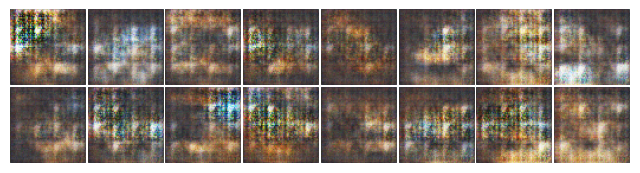

########## EPOCH : 75 : STILL TRAINING ##########


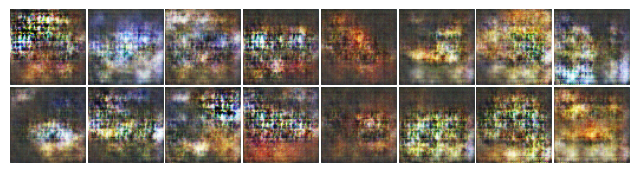

########## EPOCH : 100 : STILL TRAINING ##########


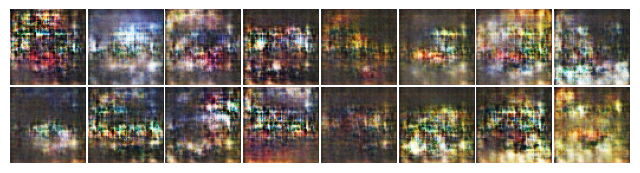

########## EPOCH : 125 : STILL TRAINING ##########


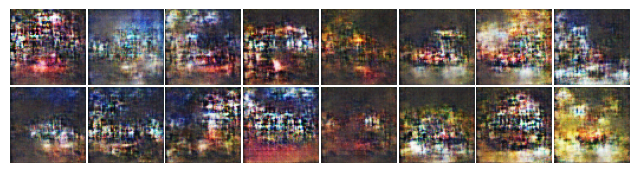

########## EPOCH : 150 : STILL TRAINING ##########


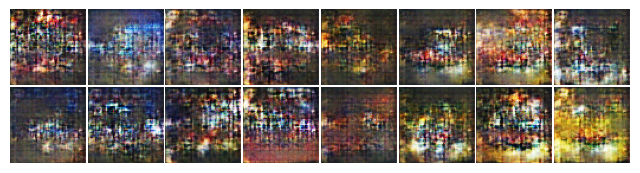

########## EPOCH : 175 : STILL TRAINING ##########


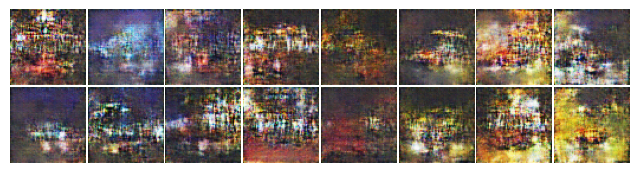

########## EPOCH : 200 : STILL TRAINING ##########


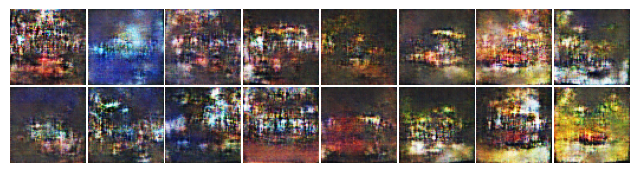

Early stopping after 210 epochs.
########## EPOCH : 209 ##########


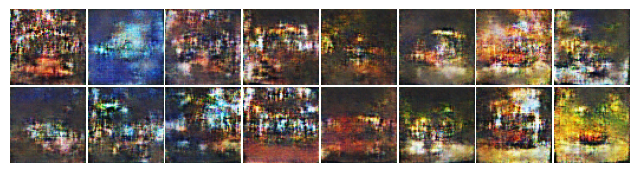

Early stopping after 210 epochs.






In [13]:
seed_all(seed_val=42)

# Create the generator
netG = Generator().to(device)
netG.apply(weights_init)

netD = Discriminator().to(device)
netD.apply(weights_init)

# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

latent_dim = 100
fixed_noise = torch.randn(64, latent_dim, 1, 1, device=device)
# Establish convention for real and fake labels during training
real_label = 1.0
fake_label = 0.0
# Learning rate for optimizers
lr = 0.0002
# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5
# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

train_loader = DataLoader(X_train, batch_size=64, shuffle=True)
w_liss = []

patience = 105
max_epochs = 1000
patience_counter=0
previous_wasserstein_distance  = float('inf')


# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
Total_losses = []
iters = 0
broken = False
for epoch in range(max_epochs):


    
    netG.train()
    netD.train()
    for batch_idx, X_batch in enumerate(train_loader):
        
        iters+=1
    
        X_norm = 2 * X_batch - 1
        X_norm = X_norm.to(device)
    
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        netD.zero_grad()
        b_size = X_norm.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(X_norm).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(b_size, latent_dim, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        
        # Update D
        optimizerD.step()


        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()


        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        Total_losses.append(G_losses[-1]+D_losses[-1])
        

        
    # After Every Epoch
    #schedulerG.step()
    #schedulerD.step()
    
    ##### USING VALIDATION SET FOR EARLY STOPPING #####

    netG.eval()
    netD.eval()
    

    with torch.no_grad():
        
        
        critic_real = netD(X_val_norm)     #.squeeze()
        fixed_test_noise = torch.randn(X_val_norm.shape[0], latent_dim, 1, 1, device=device)
        generated_test_samples = netG(fixed_test_noise)
        critic_fake = netD(generated_test_samples)     #.squeeze()
        current_wasserstein_distance = torch.mean(torch.abs(critic_fake - critic_real)).item()
        w_liss.append(current_wasserstein_distance )
        
        if epoch%25==0:
            with torch.no_grad():
                print(f'########## EPOCH : {epoch} : STILL TRAINING ##########')
                fake = netG(fixed_noise).detach().cpu()
                plot_images(((fake+1.0)/2.0)[:16])
            

        
    if current_wasserstein_distance < previous_wasserstein_distance:
        
        best_Gen_params = netG.state_dict()
        best_Dis_params = netG.state_dict()

        #patience_counter = 0
        

    else:
        patience_counter += 1
    
    previous_wasserstein_distance = current_wasserstein_distance

        
    if patience_counter >= patience:
        
        with torch.no_grad():
            print(f"Early stopping after {epoch+1} epochs.")
            print(f'########## EPOCH : {epoch} ##########')
            fake = netG(fixed_noise).detach().cpu()
            plot_images(((fake+1.0)/2.0)[:16])

        print(f"Early stopping after {epoch+1} epochs.")
        print("\n\n\n")


        break
    

fixed_noise = torch.randn(10, latent_dim, 1, 1, device=device)
fake = netG(fixed_noise).detach().cpu()
X_10_gan_C = fake[:10]

_____
## VAE on CATEGORY C
______

EPOCH : 1
RECON LOSS : 0.2897144556045532 --- KL LOSS : -287.49859619140625 --- LOSS : 0.30408939719200134
######################## STILL TRAINING ########################
####################### INPUT IMAGES #######################


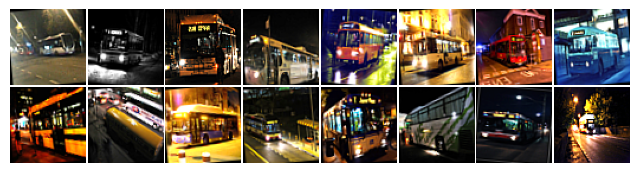

####################### RECON IMAGES #######################


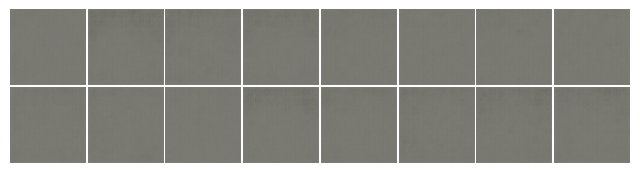

####################### GEN IMAGES #######################


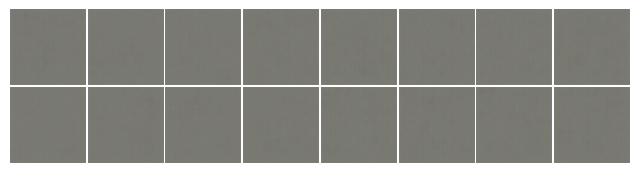





EPOCH : 26
RECON LOSS : 0.09529106318950653 --- KL LOSS : -226.71435546875 --- LOSS : 0.10662677884101868
######################## STILL TRAINING ########################
####################### INPUT IMAGES #######################


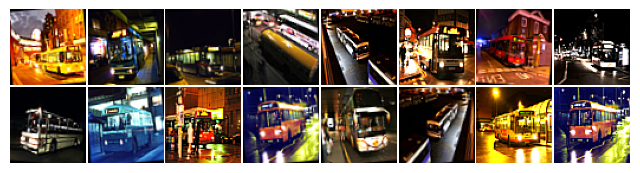

####################### RECON IMAGES #######################


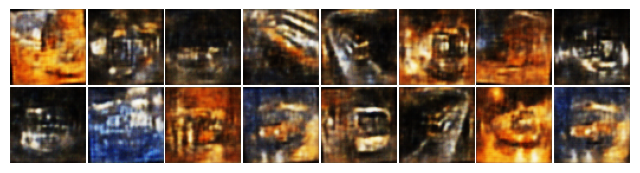

####################### GEN IMAGES #######################


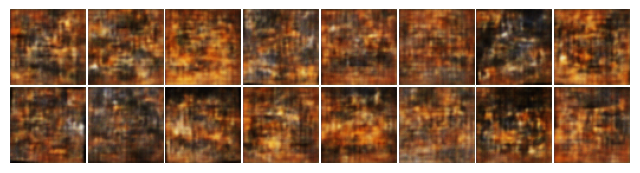





EPOCH : 51
RECON LOSS : 0.07124854624271393 --- KL LOSS : -225.2564239501953 --- LOSS : 0.08251136541366577
######################## STILL TRAINING ########################
####################### INPUT IMAGES #######################


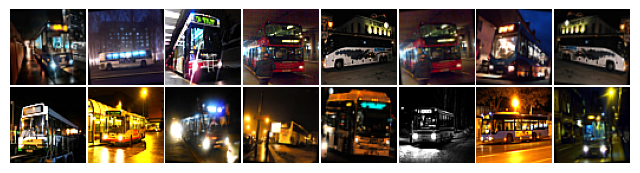

####################### RECON IMAGES #######################


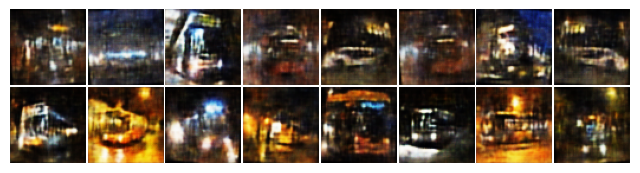

####################### GEN IMAGES #######################


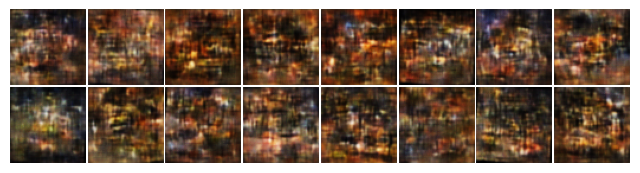





EPOCH : 76
RECON LOSS : 0.06614478677511215 --- KL LOSS : -223.54312133789062 --- LOSS : 0.07732194662094116
######################## STILL TRAINING ########################
####################### INPUT IMAGES #######################


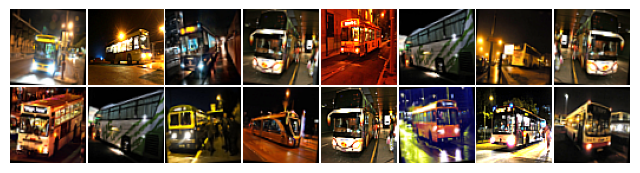

####################### RECON IMAGES #######################


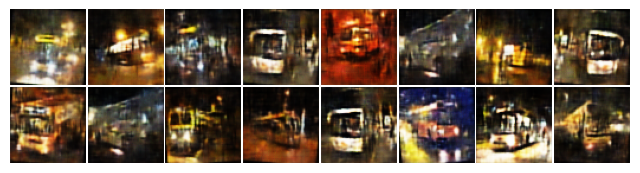

####################### GEN IMAGES #######################


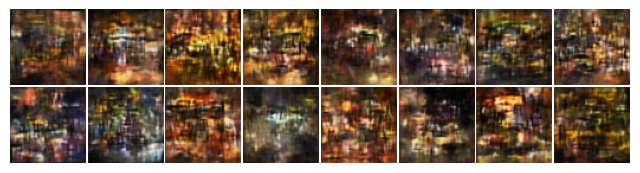





EPOCH : 101
RECON LOSS : 0.05438409745693207 --- KL LOSS : -219.256103515625 --- LOSS : 0.06534690409898758
######################## STILL TRAINING ########################
####################### INPUT IMAGES #######################


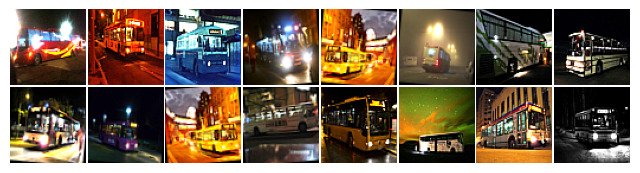

####################### RECON IMAGES #######################


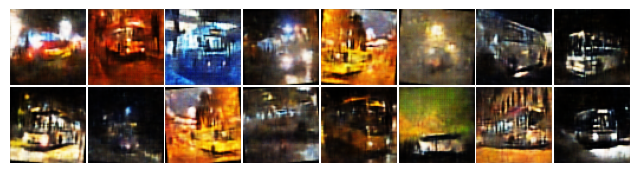

####################### GEN IMAGES #######################


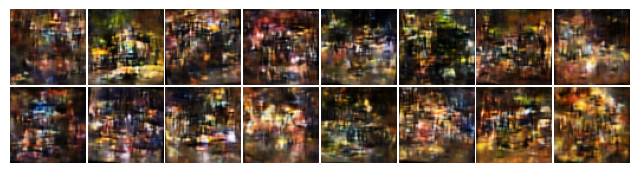





EPOCH : 126
RECON LOSS : 0.050542350858449936 --- KL LOSS : -220.73500061035156 --- LOSS : 0.06157910078763962
######################## STILL TRAINING ########################
####################### INPUT IMAGES #######################


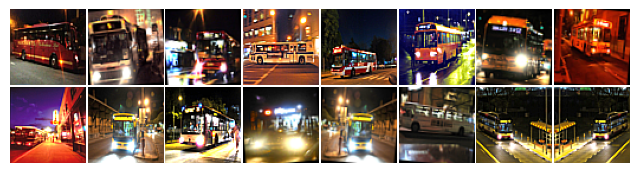

####################### RECON IMAGES #######################


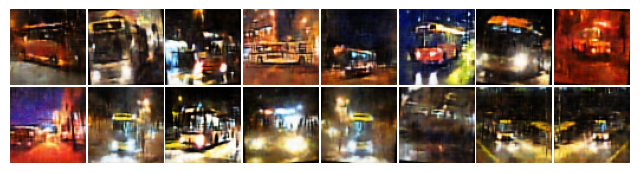

####################### GEN IMAGES #######################


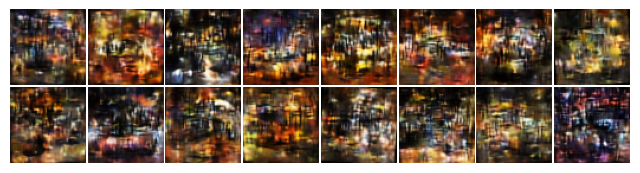





Early stopping after 150 epochs.
EPOCH : 150
RECON LOSS : 0.04851410910487175 --- KL LOSS : -223.4383087158203 --- LOSS : 0.059686023741960526
####################### INPUT IMAGES #######################


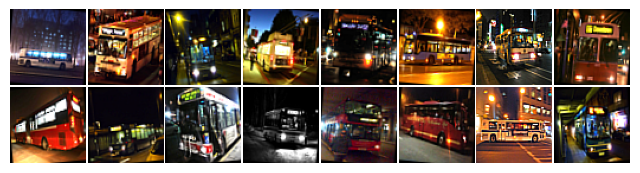

####################### RECON IMAGES #######################


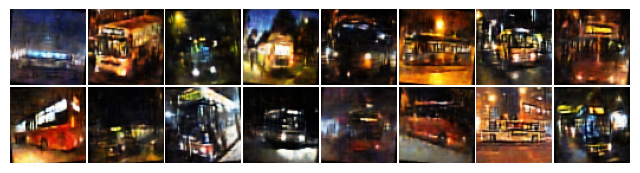

####################### GEN IMAGES #######################


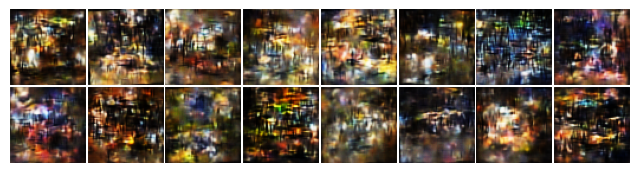

Early stopping after 150 epochs.






In [14]:
max_epochs = 1000 
patience = 120  # Number of epochs to wait for improvement

train_losses = []
plot_idx=0
for LR in [.001]:
    for KLD_WEIGHT in [5e-5]:
        
        plot_idx +=1
        title_x = str(plot_idx) + f"_LR={LR}__KLD_WEIGHT={KLD_WEIGHT}__real"
        title_recon = str(plot_idx) + f"_LR={LR}__KLD_WEIGHT={KLD_WEIGHT}__recon"
        title_gen = str(plot_idx) + f"_LR={LR}__KLD_WEIGHT={KLD_WEIGHT}__sampled"
        
        
        seed_all(seed_val=42)
        model = VAE(in_channels=3, latent_dim=256, kld_w=KLD_WEIGHT).to(device)
        
        optimizer_vae = optim.Adam(model.parameters(), lr=LR, weight_decay=1e-3)
        # Define the learning rate scheduler
        step_size = 10  # Adjust this according to your training schedule
        gamma = 0.95  # Factor by which the learning rate is reduced
        scheduler = StepLR(optimizer_vae, step_size=step_size, gamma=gamma)

        
        train_loader = DataLoader(X_train, batch_size=64, shuffle=True)
        
        
        
        best_test_loss = float('inf')
        for epoch in range(max_epochs):

            train_loss = 0
            recon_loss = 0
            kl_loss = 0
            recon_batch = None

            model.train()
            for batch_idx, X_batch in enumerate(train_loader):


                X_norm = 2 * X_batch - 1
                X_norm = X_norm.to(device)

                optimizer_vae.zero_grad()
                decoded, x, mu, log_var = model(X_norm)
                arr = [decoded, x, mu, log_var]

                loss_dict = model.loss_function(arr)

                reconstruction_loss = loss_dict['Reconstruction_Loss']
                recon_loss += reconstruction_loss

                kl_divergence_loss = loss_dict['KLD']
                kl_loss += kl_divergence_loss

                loss = loss_dict['loss']
                loss.backward()

                train_loss += loss.item()

                optimizer_vae.step()
            
            train_losses.append(train_loss)
            
            # After Every Epoch
            scheduler.step()

            ##### USING VALIDATION SET #####

            model.eval()
            
            
            if epoch%25==0:
                
                with torch.no_grad():
                
                    

                    print(f'EPOCH : {epoch+1}')
                    print(f'RECON LOSS : {reconstruction_loss} --- KL LOSS : {kl_divergence_loss} --- LOSS : {loss.item()}')
                    print("######################## STILL TRAINING ########################")

                    print("####################### INPUT IMAGES #######################")
                    plot_images((((X_norm.detach().cpu())+1.0)/2.0)[:16])

                    print("####################### RECON IMAGES #######################")
                    recons = model.generate(X_norm).detach().cpu()
                    recons = (recons+1.0)/2.0
                    plot_images(recons[:16])

                    print("####################### GEN IMAGES #######################")
                    sampled = model.sample(num_samples=64, current_device=device)
                    plot_images((((sampled.detach().cpu())+1.0)/2.0)[:16])
                    
                    print("\n\n\n")

            
            
        
            
            
            with torch.no_grad():

                test_arr = model(X_val_norm.to(device))
                test_loss_dict = model.loss_function(test_arr)
                test_loss = test_loss_dict['loss'].item()

            if test_loss < best_test_loss:

                best_test_loss = test_loss
                patience_counter = 0

            else:
                patience_counter += 1

            if patience_counter >= patience:
                
                print(f"Early stopping after {epoch+1} epochs.")
                
                print(f'EPOCH : {epoch+1}')
                print(f'RECON LOSS : {reconstruction_loss} --- KL LOSS : {kl_divergence_loss} --- LOSS : {loss.item()}')

                model.eval()

                print("####################### INPUT IMAGES #######################")
                plot_images((((X_norm.detach().cpu())+1.0)/2.0)[:16])

                print("####################### RECON IMAGES #######################")
                recons = model.generate(X_norm).detach().cpu()
                recons = (recons+1.0)/2.0
                plot_images(recons[:16])

                print("####################### GEN IMAGES #######################")
                sampled = model.sample(num_samples=64, current_device=device)
                plot_images((((sampled.detach().cpu())+1.0)/2.0)[:16])

                
                
                print(f"Early stopping after {epoch+1} epochs.")
                print("\n\n\n")
                
                
                break
                

sampled = model.sample(num_samples=10, current_device=device)
X_10_vae_C = sampled
X_10_vae_C = X_10_vae_C.detach().cpu()

_____________________________
## Category K = 'BOAT'
_____________________________


Total classes in folder : 3
Class to id dictionary : {'boat': 0, 'bus': 1, 'car': 2}
Index of the desired class : 0 
#################### SOME IMAGES FOR THE CATEGORY ####################


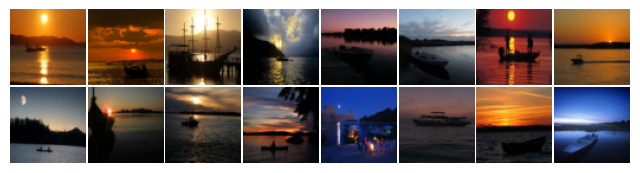

Images in the train set D1 : 102
Images in the test set V1 : 12


In [15]:
chosen_class = 'boat'     # Choose Category 'boat' 'bus' or 'car' (here K)
desired_width = 64
desired_height = 64
folder_path = './Assignment3_dataset/' 

class_names = os.listdir(folder_path)   # A list of images in folder path
print(f'Total classes in folder : {len(class_names)}')

# Create the dataset
dataset = datasets.ImageFolder(root=folder_path,
                               transform=transforms.Compose([
                               transforms.Resize((desired_height,desired_width)),
                               transforms.ToTensor(),
                           ]))


# Filter data according to desired class
print(f'Class to id dictionary : {dataset.class_to_idx}')
chosen_class_id = dataset.class_to_idx[chosen_class]
print(f'Index of the desired class : {chosen_class_id} ')

class_indices = []
for i in range(len(dataset)):
    if dataset.imgs[i][1]==chosen_class_id:
        class_indices.append(i)
subset = Subset(dataset, class_indices)

all_data = []
for idx in range(len(subset)):
    data, target = subset[idx]
    all_data.append((data, target))

d_loader = DataLoader(subset, batch_size=len(subset))
for batch in d_loader:
    X_all, _ = batch  # data and target are torch tensors

print("#################### SOME IMAGES FOR THE CATEGORY ####################")
plot_images(X_all[:16])

D1, V1 = train_test_split(X_all, test_size=0.1, random_state=42)
print(f"Images in the train set D1 : {D1.shape[0]}")
print(f"Images in the test set V1 : {V1.shape[0]}")

X_train = augment_data(D1, plot=False)
X_train = X_train[:576] 
X_val = augment_data(V1, plot=False)
X_val_norm = 2 * X_val - 1
X_val_norm  = X_val_norm.to(device)

_____
## GAN on CATEGORY K
______

########## EPOCH : 0 : STILL TRAINING ##########


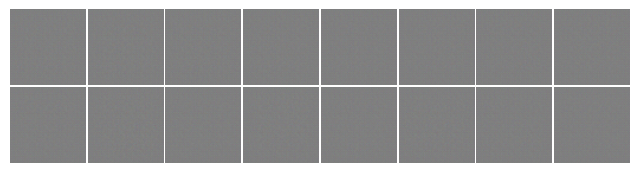

########## EPOCH : 25 : STILL TRAINING ##########


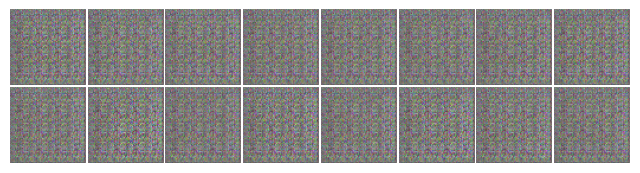

########## EPOCH : 50 : STILL TRAINING ##########


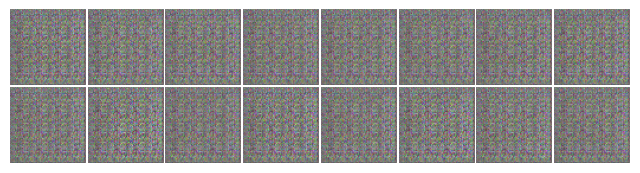

########## EPOCH : 75 : STILL TRAINING ##########


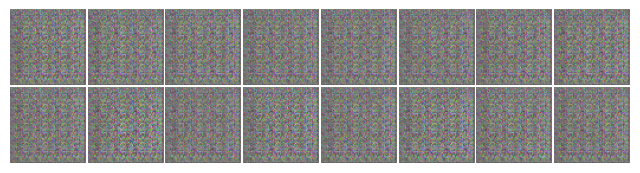

########## EPOCH : 100 : STILL TRAINING ##########


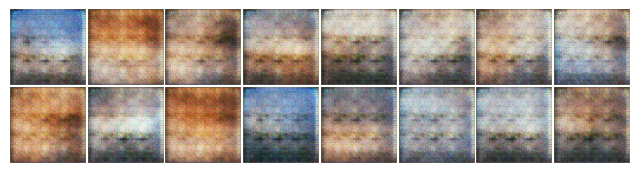

########## EPOCH : 125 : STILL TRAINING ##########


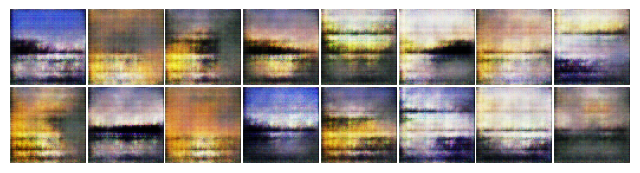

########## EPOCH : 150 : STILL TRAINING ##########


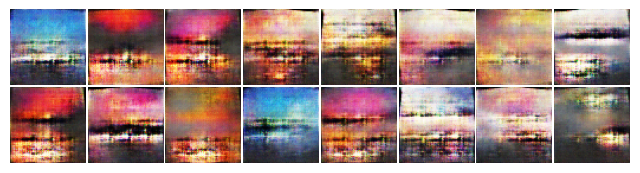

########## EPOCH : 175 : STILL TRAINING ##########


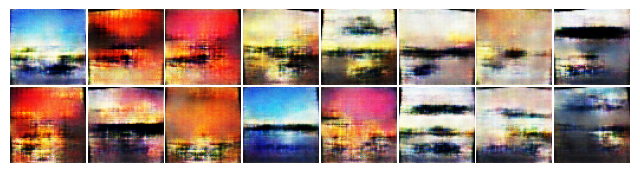

Early stopping after 176 epochs.
########## EPOCH : 175 ##########


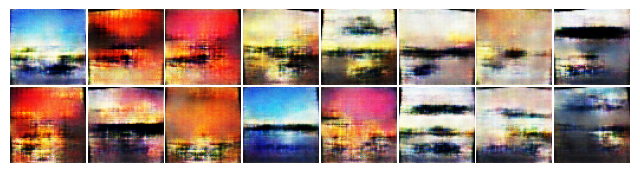

Early stopping after 176 epochs.






In [16]:
seed_all(seed_val=42)

# Create the generator
netG = Generator().to(device)
netG.apply(weights_init)

netD = Discriminator().to(device)
netD.apply(weights_init)

# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

latent_dim = 100
fixed_noise = torch.randn(64, latent_dim, 1, 1, device=device)
# Establish convention for real and fake labels during training
real_label = 1.0
fake_label = 0.0
# Learning rate for optimizers
lr = 0.0002
# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5
# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

train_loader = DataLoader(X_train, batch_size=64, shuffle=True)
w_liss = []

patience = 105
max_epochs = 1000
patience_counter=0
previous_wasserstein_distance  = float('inf')


# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
Total_losses = []
iters = 0
broken = False
for epoch in range(max_epochs):


    
    netG.train()
    netD.train()
    for batch_idx, X_batch in enumerate(train_loader):
        
        iters+=1
    
        X_norm = 2 * X_batch - 1
        X_norm = X_norm.to(device)
    
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        netD.zero_grad()
        b_size = X_norm.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(X_norm).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(b_size, latent_dim, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        
        # Update D
        optimizerD.step()


        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()


        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        Total_losses.append(G_losses[-1]+D_losses[-1])
        

        
    # After Every Epoch
    #schedulerG.step()
    #schedulerD.step()
    
    ##### USING VALIDATION SET FOR EARLY STOPPING #####

    netG.eval()
    netD.eval()
    

    with torch.no_grad():
        
        
        critic_real = netD(X_val_norm)     #.squeeze()
        fixed_test_noise = torch.randn(X_val_norm.shape[0], latent_dim, 1, 1, device=device)
        generated_test_samples = netG(fixed_test_noise)
        critic_fake = netD(generated_test_samples)     #.squeeze()
        current_wasserstein_distance = torch.mean(torch.abs(critic_fake - critic_real)).item()
        w_liss.append(current_wasserstein_distance )
        
        if epoch%25==0:
            with torch.no_grad():
                print(f'########## EPOCH : {epoch} : STILL TRAINING ##########')
                fake = netG(fixed_noise).detach().cpu()
                plot_images(((fake+1.0)/2.0)[:16])
            

        
    if current_wasserstein_distance < previous_wasserstein_distance:
        
        best_Gen_params = netG.state_dict()
        best_Dis_params = netG.state_dict()

        #patience_counter = 0
        

    else:
        patience_counter += 1
    
    previous_wasserstein_distance = current_wasserstein_distance

        
    if patience_counter >= patience:
        
        with torch.no_grad():
            print(f"Early stopping after {epoch+1} epochs.")
            print(f'########## EPOCH : {epoch} ##########')
            fake = netG(fixed_noise).detach().cpu()
            plot_images(((fake+1.0)/2.0)[:16])

        print(f"Early stopping after {epoch+1} epochs.")
        print("\n\n\n")


        break
    

fixed_noise = torch.randn(10, latent_dim, 1, 1, device=device)
fake = netG(fixed_noise).detach().cpu()
X_10_gan_K= fake[:10]

_____
## VAE on CATEGORY K
______

EPOCH : 1
RECON LOSS : 0.3818303346633911 --- KL LOSS : -453.5534362792969 --- LOSS : 0.40450799465179443
######################## STILL TRAINING ########################
####################### INPUT IMAGES #######################


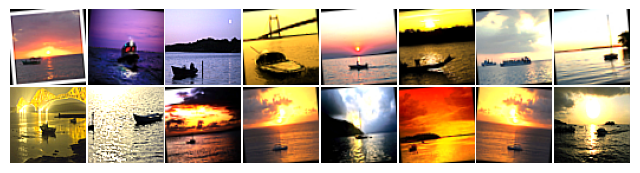

####################### RECON IMAGES #######################


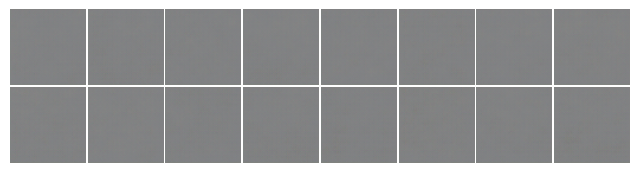

####################### GEN IMAGES #######################


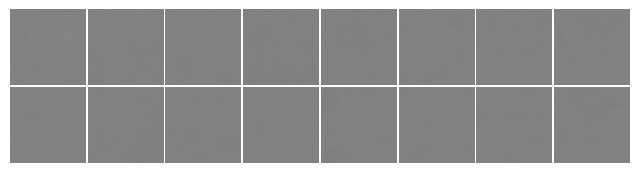





EPOCH : 26
RECON LOSS : 0.06177839636802673 --- KL LOSS : -227.73069763183594 --- LOSS : 0.0731649324297905
######################## STILL TRAINING ########################
####################### INPUT IMAGES #######################


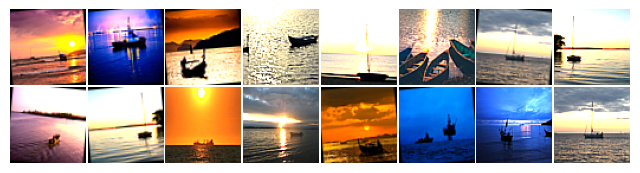

####################### RECON IMAGES #######################


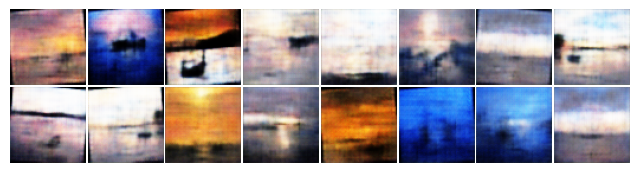

####################### GEN IMAGES #######################


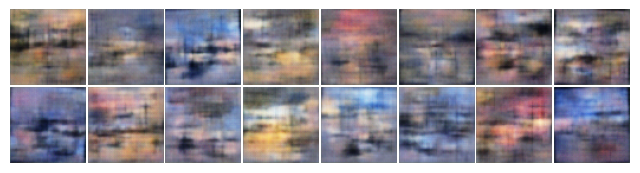





EPOCH : 51
RECON LOSS : 0.045948099344968796 --- KL LOSS : -191.21273803710938 --- LOSS : 0.05550873652100563
######################## STILL TRAINING ########################
####################### INPUT IMAGES #######################


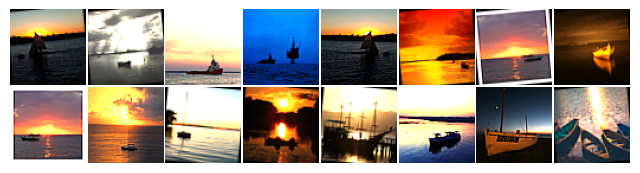

####################### RECON IMAGES #######################


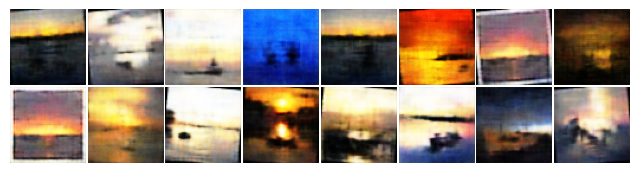

####################### GEN IMAGES #######################


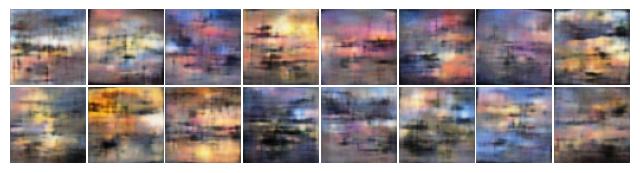





EPOCH : 76
RECON LOSS : 0.04892610013484955 --- KL LOSS : -166.960205078125 --- LOSS : 0.05727411061525345
######################## STILL TRAINING ########################
####################### INPUT IMAGES #######################


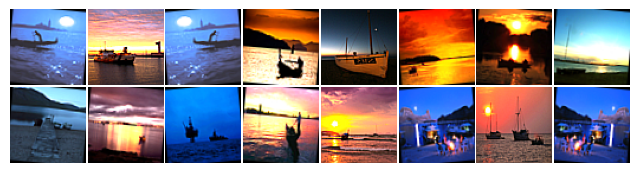

####################### RECON IMAGES #######################


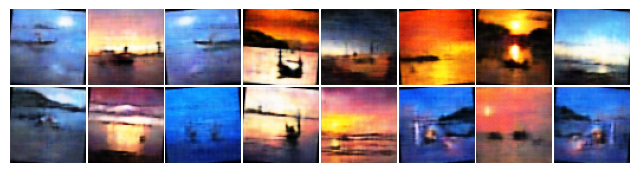

####################### GEN IMAGES #######################


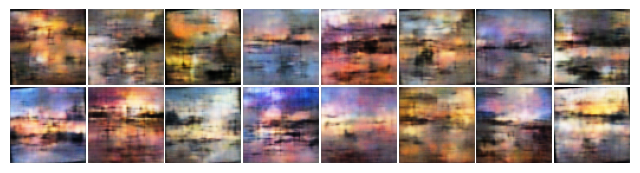





EPOCH : 101
RECON LOSS : 0.04171586036682129 --- KL LOSS : -158.74771118164062 --- LOSS : 0.049653246998786926
######################## STILL TRAINING ########################
####################### INPUT IMAGES #######################


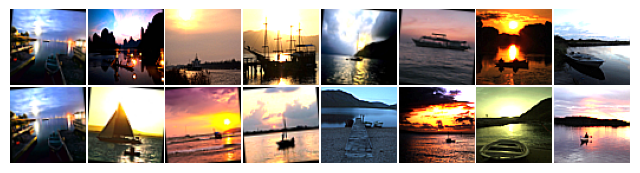

####################### RECON IMAGES #######################


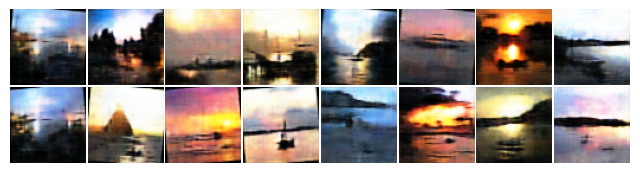

####################### GEN IMAGES #######################


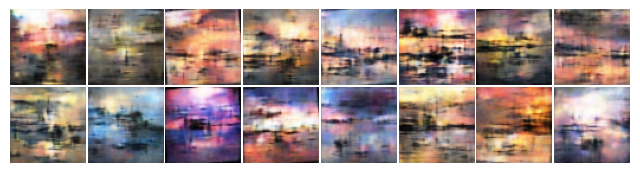





EPOCH : 126
RECON LOSS : 0.03426472470164299 --- KL LOSS : -155.46029663085938 --- LOSS : 0.04203774034976959
######################## STILL TRAINING ########################
####################### INPUT IMAGES #######################


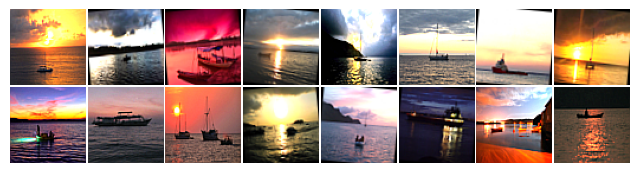

####################### RECON IMAGES #######################


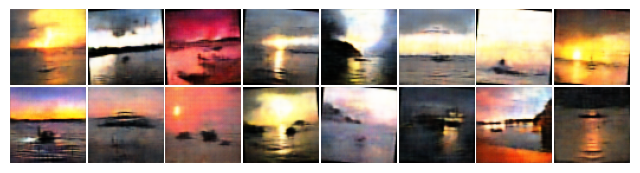

####################### GEN IMAGES #######################


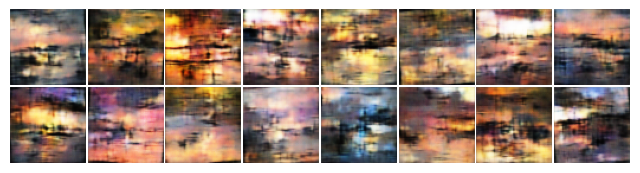





EPOCH : 151
RECON LOSS : 0.029983198270201683 --- KL LOSS : -148.6649169921875 --- LOSS : 0.03741644322872162
######################## STILL TRAINING ########################
####################### INPUT IMAGES #######################


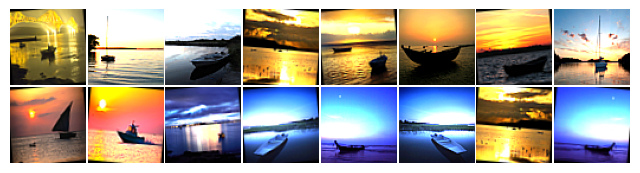

####################### RECON IMAGES #######################


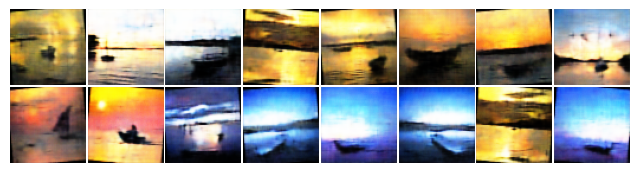

####################### GEN IMAGES #######################


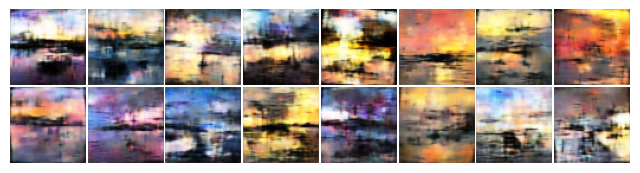





EPOCH : 176
RECON LOSS : 0.02955680899322033 --- KL LOSS : -140.44497680664062 --- LOSS : 0.036579057574272156
######################## STILL TRAINING ########################
####################### INPUT IMAGES #######################


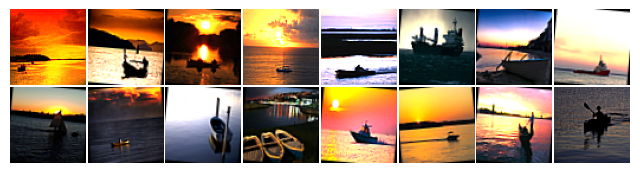

####################### RECON IMAGES #######################


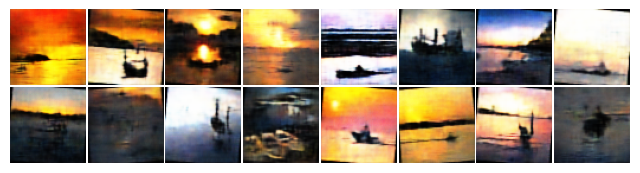

####################### GEN IMAGES #######################


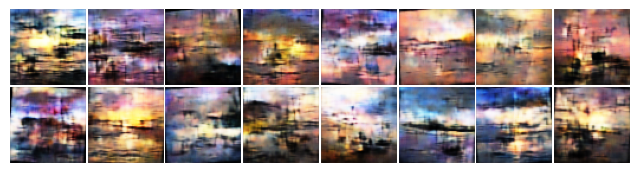





Early stopping after 183 epochs.
EPOCH : 183
RECON LOSS : 0.03044125996530056 --- KL LOSS : -145.11248779296875 --- LOSS : 0.03769688308238983
####################### INPUT IMAGES #######################


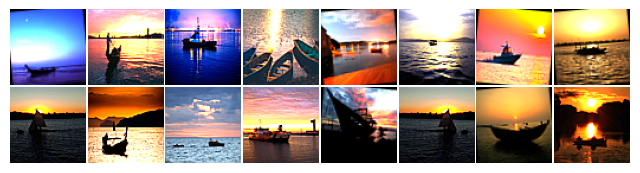

####################### RECON IMAGES #######################


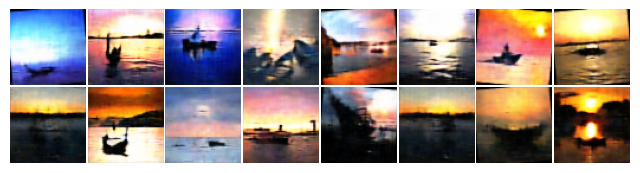

####################### GEN IMAGES #######################


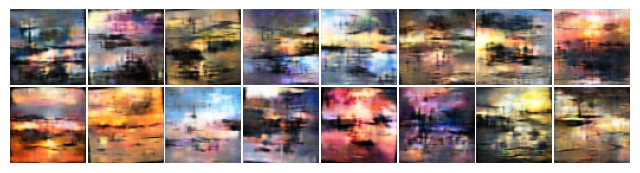

Early stopping after 183 epochs.






In [17]:
max_epochs = 1000 
patience = 120  # Number of epochs to wait for improvement

train_losses = []
plot_idx=0
for LR in [.001]:
    for KLD_WEIGHT in [5e-5]:
        
        plot_idx +=1
        title_x = str(plot_idx) + f"_LR={LR}__KLD_WEIGHT={KLD_WEIGHT}__real"
        title_recon = str(plot_idx) + f"_LR={LR}__KLD_WEIGHT={KLD_WEIGHT}__recon"
        title_gen = str(plot_idx) + f"_LR={LR}__KLD_WEIGHT={KLD_WEIGHT}__sampled"
        
        
        seed_all(seed_val=42)
        model = VAE(in_channels=3, latent_dim=256, kld_w=KLD_WEIGHT).to(device)
        
        optimizer_vae = optim.Adam(model.parameters(), lr=LR, weight_decay=1e-3)
        # Define the learning rate scheduler
        step_size = 10  # Adjust this according to your training schedule
        gamma = 0.95  # Factor by which the learning rate is reduced
        scheduler = StepLR(optimizer_vae, step_size=step_size, gamma=gamma)

        
        train_loader = DataLoader(X_train, batch_size=64, shuffle=True)
        
        
        
        best_test_loss = float('inf')
        for epoch in range(max_epochs):

            train_loss = 0
            recon_loss = 0
            kl_loss = 0
            recon_batch = None

            model.train()
            for batch_idx, X_batch in enumerate(train_loader):


                X_norm = 2 * X_batch - 1
                X_norm = X_norm.to(device)

                optimizer_vae.zero_grad()
                decoded, x, mu, log_var = model(X_norm)
                arr = [decoded, x, mu, log_var]

                loss_dict = model.loss_function(arr)

                reconstruction_loss = loss_dict['Reconstruction_Loss']
                recon_loss += reconstruction_loss

                kl_divergence_loss = loss_dict['KLD']
                kl_loss += kl_divergence_loss

                loss = loss_dict['loss']
                loss.backward()

                train_loss += loss.item()

                optimizer_vae.step()
            
            train_losses.append(train_loss)
            
            # After Every Epoch
            scheduler.step()

            ##### USING VALIDATION SET #####

            model.eval()
            
            
            if epoch%25==0:
                
                with torch.no_grad():
                
                    

                    print(f'EPOCH : {epoch+1}')
                    print(f'RECON LOSS : {reconstruction_loss} --- KL LOSS : {kl_divergence_loss} --- LOSS : {loss.item()}')
                    print("######################## STILL TRAINING ########################")

                    print("####################### INPUT IMAGES #######################")
                    plot_images((((X_norm.detach().cpu())+1.0)/2.0)[:16])

                    print("####################### RECON IMAGES #######################")
                    recons = model.generate(X_norm).detach().cpu()
                    recons = (recons+1.0)/2.0
                    plot_images(recons[:16])

                    print("####################### GEN IMAGES #######################")
                    sampled = model.sample(num_samples=64, current_device=device)
                    plot_images((((sampled.detach().cpu())+1.0)/2.0)[:16])
                    
                    print("\n\n\n")

            
            
        
            
            
            with torch.no_grad():

                test_arr = model(X_val_norm.to(device))
                test_loss_dict = model.loss_function(test_arr)
                test_loss = test_loss_dict['loss'].item()

            if test_loss < best_test_loss:

                best_test_loss = test_loss
                patience_counter = 0

            else:
                patience_counter += 1

            if patience_counter >= patience:
                
                print(f"Early stopping after {epoch+1} epochs.")
                
                print(f'EPOCH : {epoch+1}')
                print(f'RECON LOSS : {reconstruction_loss} --- KL LOSS : {kl_divergence_loss} --- LOSS : {loss.item()}')

                model.eval()

                print("####################### INPUT IMAGES #######################")
                plot_images((((X_norm.detach().cpu())+1.0)/2.0)[:16])

                print("####################### RECON IMAGES #######################")
                recons = model.generate(X_norm).detach().cpu()
                recons = (recons+1.0)/2.0
                plot_images(recons[:16])

                print("####################### GEN IMAGES #######################")
                sampled = model.sample(num_samples=64, current_device=device)
                plot_images((((sampled.detach().cpu())+1.0)/2.0)[:16])

                
                
                print(f"Early stopping after {epoch+1} epochs.")
                print("\n\n\n")
                
                
                break
                

sampled = model.sample(num_samples=10, current_device=device)
X_10_vae_K = sampled
X_10_vae_K = X_10_vae_K.detach().cpu()

___________________
# ANALYSIS  : OBSERVATIONS AND COMMENTS
_________________

Lets begin by anlysing the images for category C

#############  C : BUS GENERATION BY VAE  #############


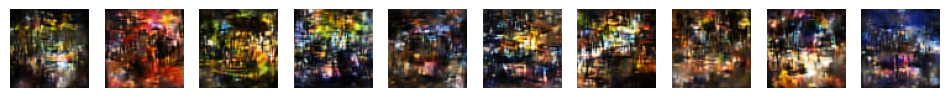

#############  C : BUS GENERATION BY GAN  #############


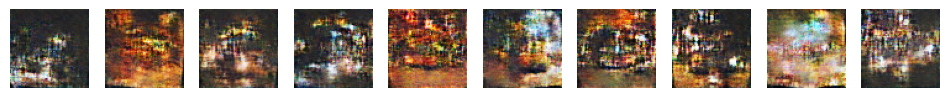

In [18]:
print("#############  C : BUS GENERATION BY VAE  #############")
show_10(X_10_vae_C)
print("#############  C : BUS GENERATION BY GAN  #############")
show_10(X_10_gan_C)

Next we move to images for category K

#############  K : BOAT GENERATION BY VAE  #############


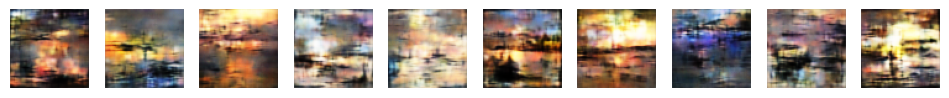

#############  K : BOAT GENERATION BY GAN  #############


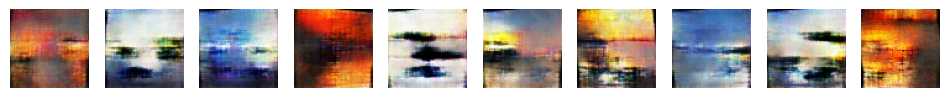

In [19]:
print("#############  K : BOAT GENERATION BY VAE  #############")
show_10(X_10_vae_K)
print("#############  K : BOAT GENERATION BY GAN  #############")
show_10(X_10_gan_K)

1. It is observed that the generated images by DC-GAN are much more interpretable and clear. This is because the DC-GAN uses special convolution networks as encoder and decoder, which are especially helpful for image based tasks. <br><br>
2. However comparing DC-GAN of C to DC-GAN of K clearly shows that tha K(BOAT) images are not as distinct as C(BUS) images. This is because the DC-GAN was fine tuned for category C ie BUS images.<br><br>
3. It was also observed that the time taken for VAE was less compared to GAN(for category C). This is an expected characteristic of GAN, as VAE's are faster than GANs.<br><br>
<code> Category C : VAE 150 epochs GAN 210 epochs </code> <br><br>

4. However for Category K this pattern is reversed ie <code> Category K : VAE 183 epochs GAN 176 epochs </code>. This is because DC-GAN is not fine tuned for category K






_____
# ###############THANK YOU###############
_____